In [138]:
%pip install sklearn

  Using cached sklearn-0.0.tar.gz (1.1 kB)
     |████████████████████████████████| 8.0 MB 560 kB/s eta 0:00:01
     |████████████████████████████████| 306 kB 38.2 MB/s eta 0:00:01
  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1309 sha256=b1822a132be53058da84caa1bd25ecfd397e2e2de84bfd343a7a9bae8facd2d9
  Stored in directory: /Users/andymcsweeney/Library/Caches/pip/wheels/e4/7b/98/b6466d71b8d738a0c547008b9eb39bf8676d1ff6ca4b22af1c
Successfully built sklearn
You should consider upgrading via the '/usr/local/opt/python@3.9/bin/python3.9 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [139]:
import arviz as az
import numpy as np
import pandas as pd
import pymc3 as pm
import seaborn as sns
import theano

from sklearn.linear_model import LinearRegression

from matplotlib import pylab as plt
from scipy import stats

In [140]:
RANDOM_SEED = 8927
np.random.seed(RANDOM_SEED)

%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")
az.rcParams["stats.hdi_prob"] = 0.89

# theano.config.compute_test_value = 'ignore'

In [141]:
def plot_predictive(prior_predictive):
    _, ax = plt.subplots()

    x = np.linspace(-2, 2, 50)

    for a, b in zip(prior_predictive["a"], prior_predictive["b"]):
        y = a + b * x
        ax.plot(x, y, c="k", alpha=0.4)

    ax.set_xlabel("Predictor")
    ax.set_ylabel("Mean Outcome")

# Geocentric Models

## Easy

## 4E1. 

In the model definition below, which line is the likelihood?

$$y_i \sim Normal(\mu, \sigma)$$

$$\mu \sim Normal(0, 10)$$

$$\sigma \sim Exponential(1)$$

**Answer**

The likelihood is **$y_i \sim Normal(\mu, \sigma)$**.

## 4E2.

In the model definition just above, how many parameters are in the posterior distribution.

**Answer**

There are two parameters in the posterior distribution: $\mu$ and $\sigma$.

## 4E3.

Using the model definition above, write down the approximate form of Bayes' theorem that includes the proper likelihood and priors.

**Answer**

**TBD**

## 4E4.

In the model definition below, which line is the linear model?

$$y_i \sim Normal(\mu, \sigma)$$

$$\mu_1 = \alpha + \beta x_1$$

$$\alpha \sim Normal(0, 10)$$

$$\beta \sim Normal(0, 1)$$

$$\sigma \sim Exponential(1)$$

**Answer**

The linear model is $\mu_1 = \alpha + \beta x_1$.

## 4E5.

In the model definition just above, how many parameters are in the posterior distribution?

**Answer**

$\alpha$, $\beta$, and $\sigma$

4M1.

For the model definition below, simulate observed variable $y$ values from the prior (not the posterior)

$$y_i \sim Normal(\mu, \sigma)$$

$$\mu \sim Normal(0, 10)$$

$$\sigma \sim Exponential(1)$$

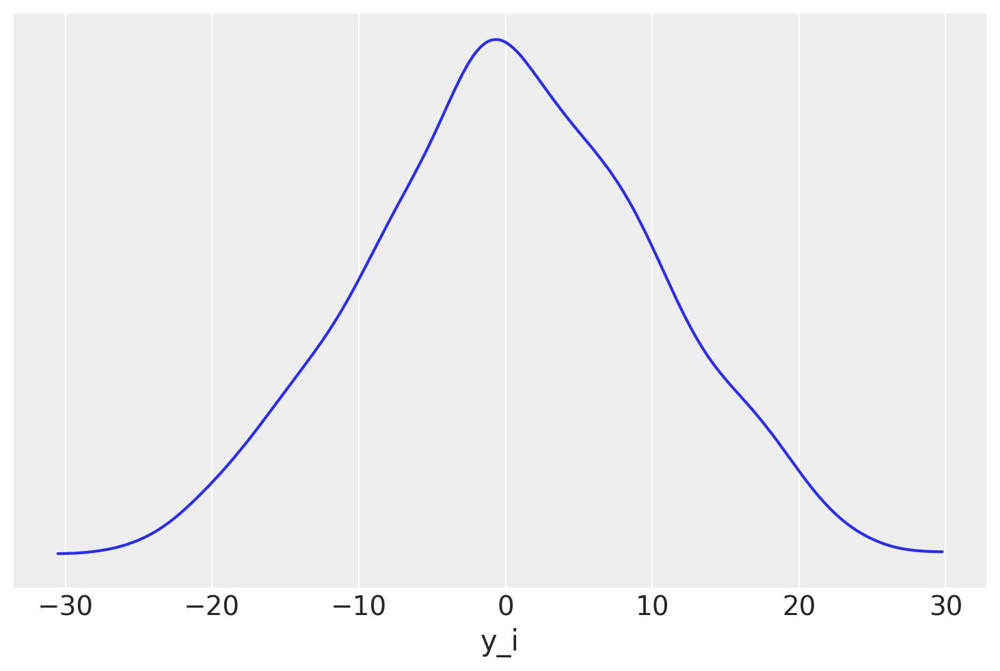

In [13]:
n_samples = 1000
mu = np.random.normal(0, 10, size=n_samples)  # prior for mu
sigma = np.random.exponential(1, size=n_samples)  # prior for sigma
prior_y = np.random.normal(mu, sigma)
# plt.hist(prior_y)
az.plot_kde(prior_y)
plt.xlabel("y_i")
plt.yticks([]);

## Medium

## 4M2.

Not applicable.

## 4M3.

Not applicable

## 4M4.

A sample of students is measured for height each year for three years. After the third year, you want to fit a linear regression predicting height using year as a predictor. Write down the mathematical model definition for this regression, using any variable names and priors you choose. Be prepared to defend your choice of priors.

**Answer**

$$height_i \sim Normal(\mu, \sigma)$$

$$\mu_i = \alpha + \beta_1 year_1 + \beta_2 year_2 + \beta_3 year_3$$

$$\alpha \sim Normal(0, 10)$$

$$\beta_1 \sim Normal(0, 1)$$

$$\beta_2 \sim Normal(0, 1)$$

$$\beta_3 \sim Normal(0, 1)$$

$$\sigma \sim Exponential(1)$$

## 4M7.

Refit model $m4.3$ from the chapter, but omit the mean weight $xbar$ this time. Compare the new models posterior to that of the original model. In particular, look at the covariance among parameters. What is different? Then compare the posterior predictions of both models.

In [5]:
d = pd.read_csv("../Data/Howell1.csv", sep=";", header=0)
d2 = d[d.age >= 18]

xbar = d2.weight.mean()

In [15]:
d2.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041914,41.0,1
4,145.415,41.276872,51.0,0


In [17]:
# Original model
with pm.Model() as m4_3:
    a = pm.Normal("a", mu=178, sd=20)
    b = pm.Lognormal("b", mu=0, sd=1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = a + b * (d2.weight - xbar)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)

/var/folders/gg/8bsht44j631ftcb7v2s5lytm0000gn/T/ipykernel_7758/387894122.py:2: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_4_3 = pm.sample(1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 11 seconds.


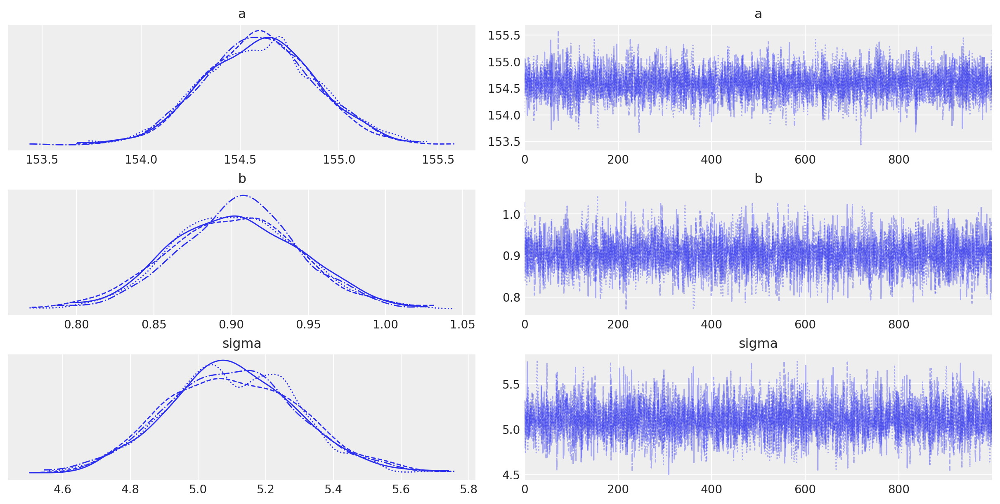

In [34]:
with m4_3:
    trace_4_3 = pm.sample(1000, tune=1000)
    az.plot_trace(trace_4_3)

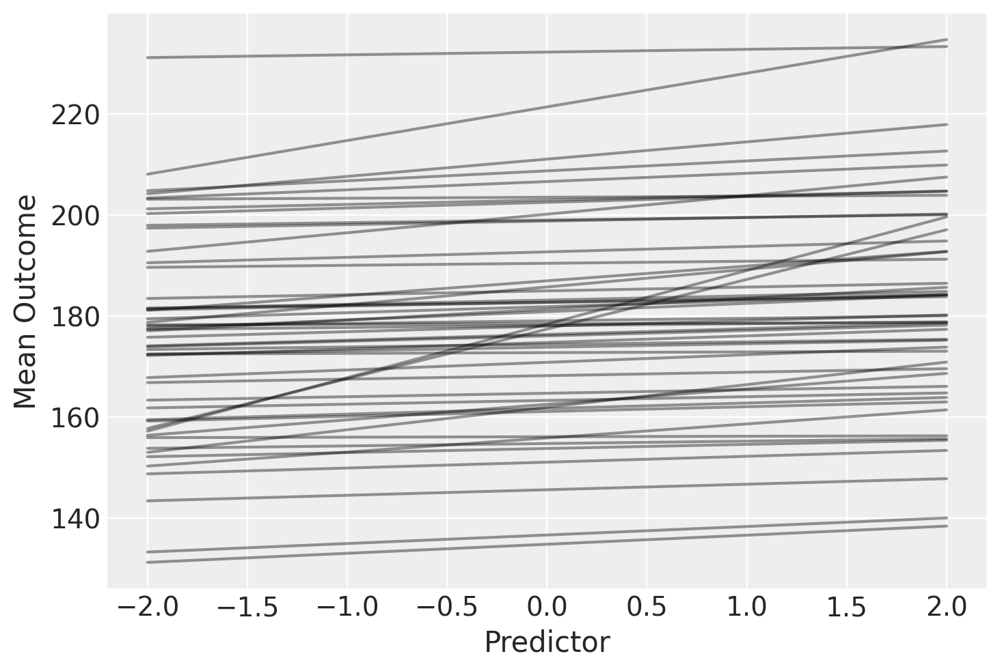

In [35]:
with m4_3:
    prior_predictive = pm.sample_prior_predictive(samples=50)
    
plot_predictive(prior_predictive)

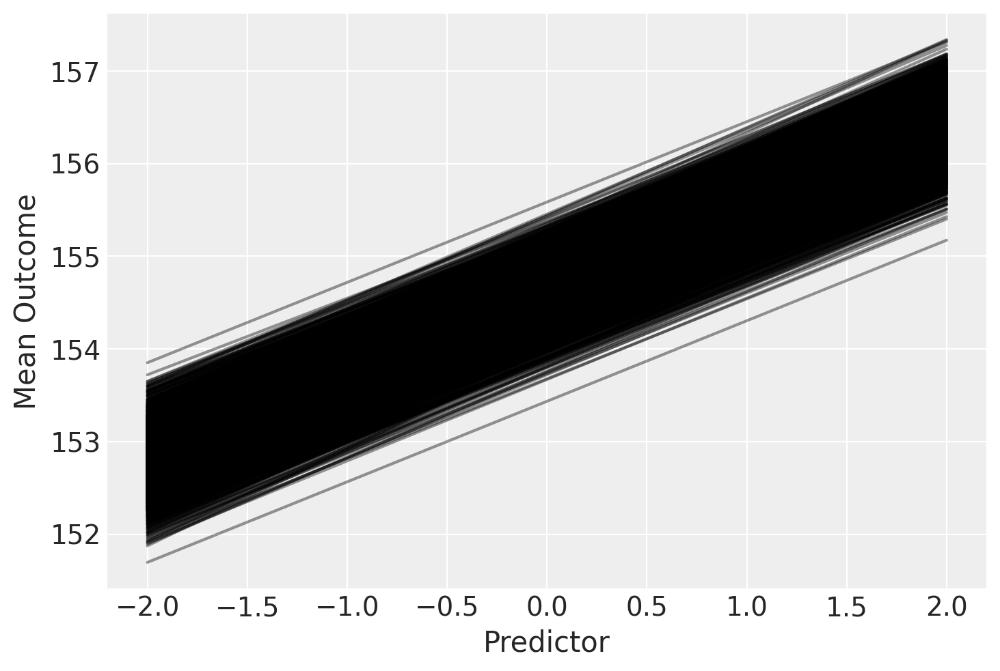

In [40]:
with m4_3:
    posterior_checks = pm.sample_posterior_predictive(trace_4_3, var_names=["a", "b", "height"])
    


In [43]:
az.summary(trace_4_3_new, kind="stats")

/usr/local/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,114.564,1.922,111.621,117.696
b,0.890,0.042,0.827,0.961
sigma,5.108,0.196,4.822,5.447


In [21]:
# New model
with pm.Model() as m4_3_new:
    a = pm.Normal("a", mu=178, sd=20)
    b = pm.Lognormal("b", mu=0, sd=1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = a + b * (d2.weight)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)

/var/folders/gg/8bsht44j631ftcb7v2s5lytm0000gn/T/ipykernel_7758/196315364.py:2: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_4_3_new = pm.sample(1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 14 seconds.
The acceptance probability does not match the target. It is 0.8796419967033807, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.9035301036428344, but should be close to 0.8. Try to increase the number of tuning steps.


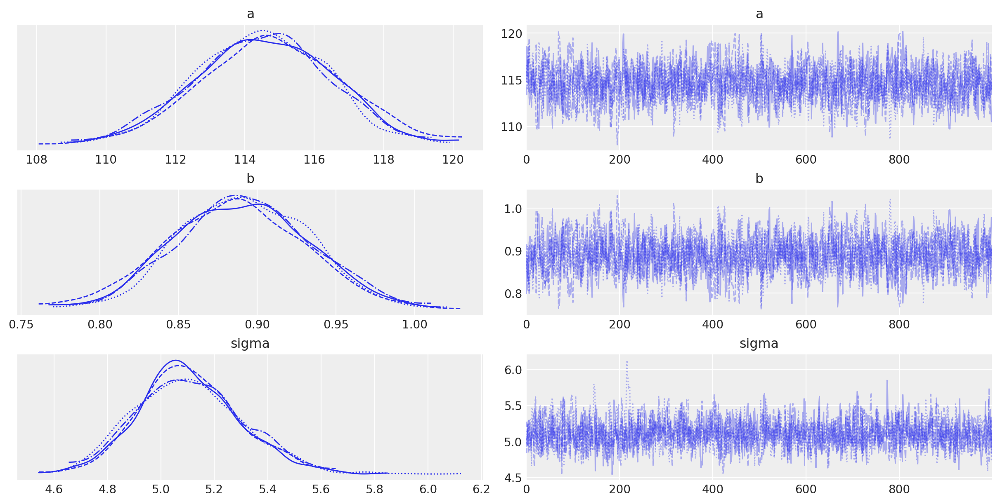

In [32]:
with m4_3_new:
    trace_4_3_new = pm.sample(1000, tune=1000)
    az.plot_trace(trace_4_3_new)

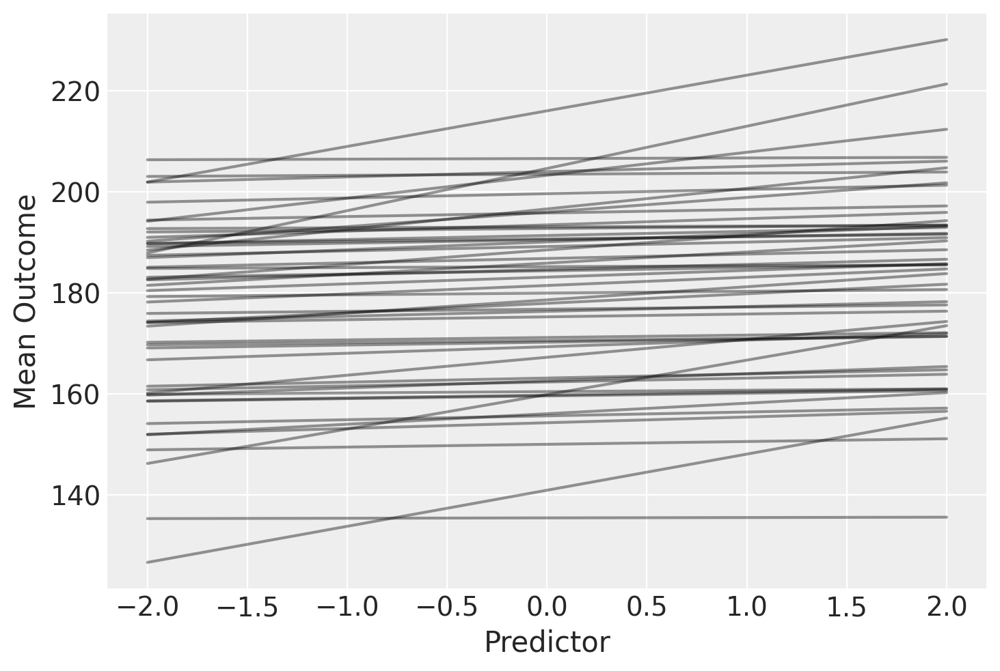

In [33]:
with m4_3_new:
    prior_predictive = pm.sample_prior_predictive(samples=50)
    
plot_predictive(prior_predictive)

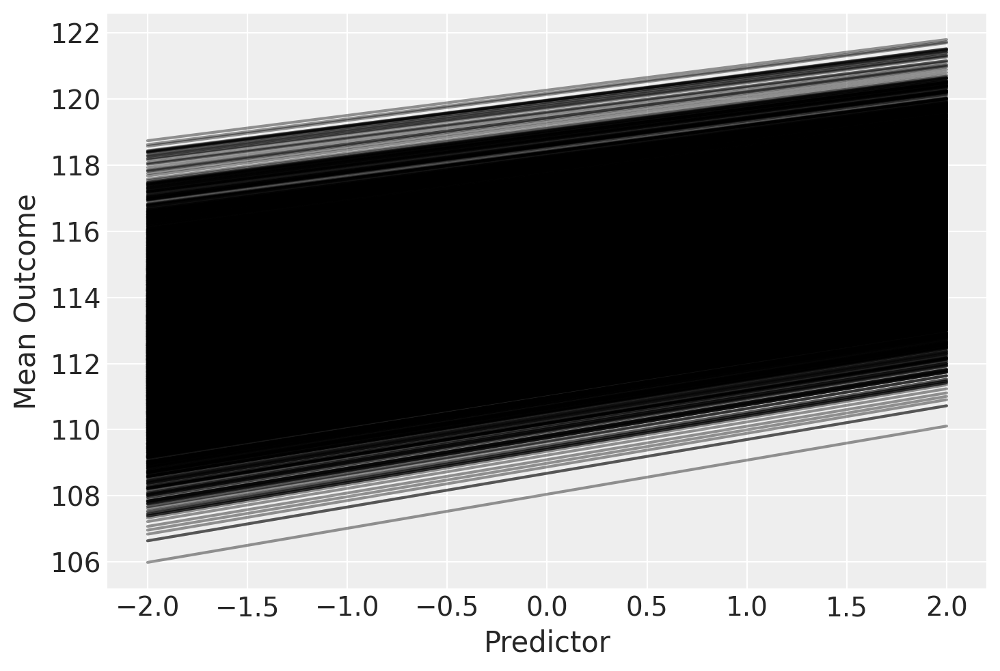

In [41]:
with m4_3_new:
    posterior_checks = pm.sample_posterior_predictive(trace_4_3_new, var_names=["a", "b", "height"])
    
plot_predictive(posterior_checks)

In [42]:
az.summary(trace_4_3_new, kind="stats")

/usr/local/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,114.564,1.922,111.621,117.696
b,0.890,0.042,0.827,0.961
sigma,5.108,0.196,4.822,5.447


## 4M8.

In the chapter, we used 15 knots with the cherry blossom splines. Increase the number of knots and observe what happens to the resulting spline. Then adjust also the width of the prior on the weights - change the standard deviation of the prior and watch what happens. What do you think the combination of knot number and the prior on the weight controls?

In [45]:
d = pd.read_csv("../Data/cherry_blossoms.csv")
# nans are not treated as in the book
az.summary(d.dropna().to_dict(orient="list"), kind="stats")

,mean,sd,hdi_5.5%,hdi_94.5%
year,1533.395,291.123,1123.00,1978.00
doy,104.921,6.258,95.00,114.00
temp,6.100,0.683,5.00,7.13
temp_upper,6.938,0.812,5.57,7.98
temp_lower,5.264,0.762,4.12,6.40


In [57]:
d2 = d.dropna(subset=["doy"])
num_knots = 50
knot_list = np.quantile(d2.year, np.linspace(0, 1, num_knots))

knot_list

array([ 812.        ,  912.85714286,  965.71428571, 1016.57142857,
       1071.85714286, 1112.57142857, 1141.28571429, 1174.        ,
       1201.85714286, 1226.71428571, 1255.71428571, 1285.42857143,
       1319.57142857, 1356.14285714, 1377.        , 1406.85714286,
       1425.71428571, 1445.14285714, 1462.42857143, 1484.28571429,
       1501.14285714, 1518.        , 1534.85714286, 1551.71428571,
       1570.57142857, 1591.42857143, 1609.28571429, 1629.42857143,
       1650.        , 1668.85714286, 1685.71428571, 1702.57142857,
       1722.42857143, 1740.28571429, 1757.14285714, 1774.        ,
       1790.85714286, 1807.71428571, 1824.57142857, 1841.42857143,
       1858.28571429, 1876.14285714, 1893.        , 1910.85714286,
       1929.71428571, 1947.57142857, 1964.42857143, 1981.28571429,
       1998.14285714, 2015.        ])

In [58]:
from patsy import dmatrix

B = dmatrix(
    "bs(year, knots=knots, degree=3, include_intercept=True) - 1",
    {"year": d2.year.values, "knots": knot_list[1:-1]},
)

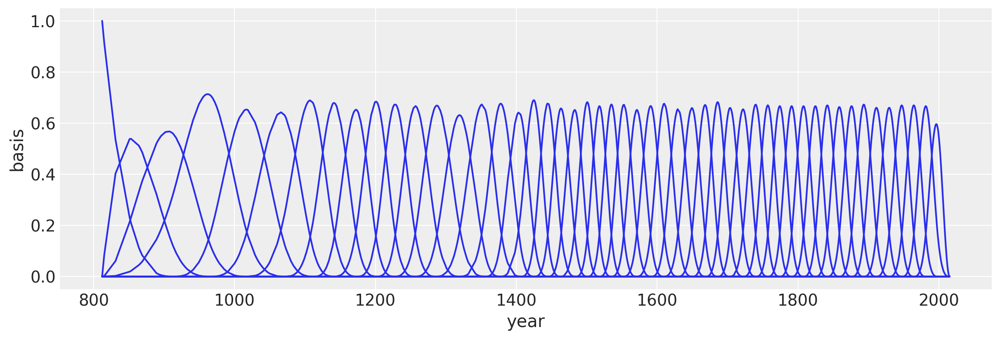

In [63]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))
for i in range(50):
    ax.plot(d2.year, (B[:, i]), color="C0")
ax.set_xlabel("year")
ax.set_ylabel("basis");

In [68]:
with pm.Model() as m4_7:
    a = pm.Normal("a", 100, 5)
    w = pm.Normal("w", mu=0, sd=5, shape=B.shape[1])
    mu = pm.Deterministic("mu", a + pm.math.dot(np.asarray(B, order="F"), w.T))
    # mu = pm.Deterministic("mu", a + pm.math.dot(B.base, w.T))
    sigma = pm.Exponential("sigma", 1)
    D = pm.Normal("D", mu, sigma, observed=d2.doy)
    trace_m4_7 = pm.sample(1000)

/var/folders/gg/8bsht44j631ftcb7v2s5lytm0000gn/T/ipykernel_7758/1371564546.py:8: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_m4_7 = pm.sample(1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, w, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 18 seconds.


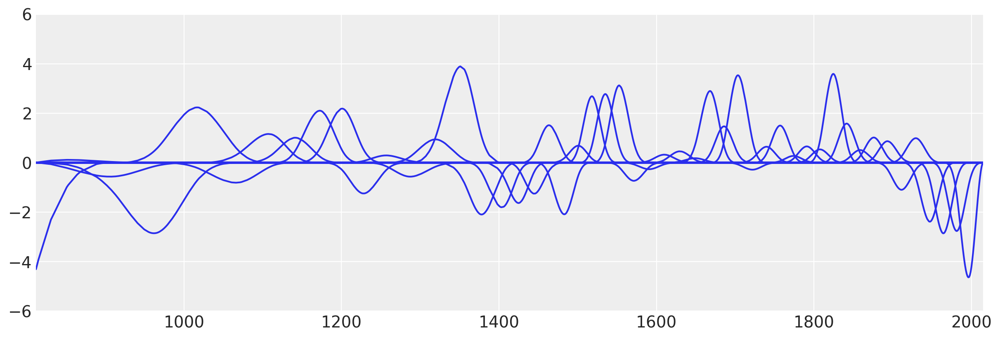

In [69]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))
wp = trace_m4_7[w].mean(0)
for i in range(50):
    ax.plot(d2.year, (wp[i] * B[:, i]), color="C0")
ax.set_xlim(812, 2015)
ax.set_ylim(-6, 6);

/usr/local/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


Text(0, 0.5, 'days in year')

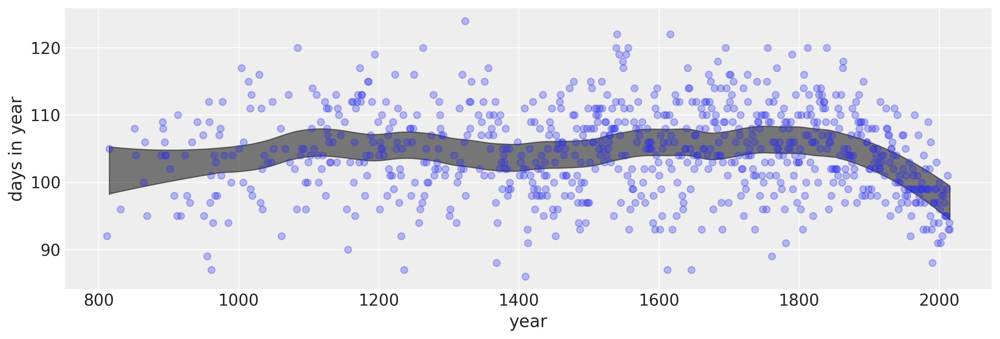

In [70]:
ax = az.plot_hdi(d2.year, trace_m4_7["mu"], color="k")
ax.plot(d2.year, d2.doy, "o", alpha=0.3)
fig = plt.gcf()
fig.set_size_inches(12, 4)
ax.set_xlabel("year")
ax.set_ylabel("days in year")

## Hard

## 4H1.

The weights listed below are recorded in the !Kung census, but the heights werw not recorded for these individuals. Provide predicted heights and 89% intervals for each of these individuals. That is, fill in the table below, using model-based predictions.

In [79]:
d = pd.read_csv("../Data/Howell1.csv", sep=";", header=0)
d2 = d[d.age >= 18]

d

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041914,41.0,1
4,145.415,41.276872,51.0,0
...,...,...,...,...
539,145.415,31.127751,17.0,1
540,162.560,52.163080,31.0,1
541,156.210,54.062497,21.0,0
542,71.120,8.051258,0.0,1


In [ ]:
def compute_mu(x):
    return post_samples[:, 0] + post_samples[:, 1] * (x - np.mean(d2.log_weight))

In [81]:
with pm.Model() as m4_1:
    alpha = pm.Normal("alpha", mu=178, sd=20)  # prior on alpha
    beta = pm.Lognormal("beta", mu=0, tau=1)  # prior on beta
    sigma = pm.Uniform("sigma", 0, 50)  # prior on sigma
    mu = alpha + beta * d2.weight.values
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)  # likelihood of the data
    mean_q = pm.find_MAP()
    print(mean_q)
    # find the hessian matrix
    Hess = pm.find_hessian(mean_q, vars=[alpha, beta, sigma])


{'alpha': array(114.5342983), 'beta_log__': array(-0.11571346), 'sigma_interval__': array(-2.18116842), 'beta': array(0.89073042), 'sigma': array(5.07271819)}


In [182]:
# define the data
individuals = np.linspace(1, 5, 5)
weight = np.array([46.95, 43.72, 64.78, 32.59, 54.63])
# compute the mean predictions
means = mean_q["alpha"] + mean_q["beta"] * weight

# compute the prediction intervals
pred_intervals = np.array(
    [az.hdi(np.random.normal(loc=compute_mu(x), scale=post_samples[:, 2])) for x in weight]
)

data_dict = {
    "Individual": individuals,
    "Weight": weight,
    "Expected height": means,
    "Low_interval": pred_intervals[:, 0],
    "Upper_interval": pred_intervals[:, 1],
}

data_dict

{'Individual': array([1., 2., 3., 4., 5.]),
 'Weight': array([46.95, 43.72, 64.78, 32.59, 54.63]),
 'Expected height': array([31.41195168, 29.34679202, 42.81188879, 22.23062264, 36.32230036]),
 'Low_interval': array([29.7342719 , 27.54489459, 40.98884571, 20.58118614, 34.56002962]),
 'Upper_interval': array([33.10098527, 30.86081712, 44.69877566, 23.79770233, 38.07696372])}

## 4H2.

Select out all the rows in the Howell1 data with ages below 18 years of age. If you do it right, you should end up with a new data frame with 192 rows in it.

(a) Fit a linear regression to these data, using quap. Present and interpret the estimates. For every 10 units of increase in weight, how much taller does the model predict a child gets?

(b) Plot the raw data, with height on the vertical axis and weight on the horizontal axis. Superimpose the MAP regression line and 89% interval for the mean. Also superimpose the 89% interval for predicted heights.

(c) What aspect of the model fit concern you? Describe the kinds of assumptions you would change, if any, to improve the model. You don't have to write any new code. Just explain what the model appears to be doing a bad job of, and what you hypothesize would be a better model.

In [188]:
howell = pd.read_csv("../Data/Howell1.csv", sep=";", header=0)
howell_u18 = howell[howell.age < 18 ]

xbar = howell_u18.weight.mean()

howell_u18.head()

,height,weight,age,male
18,121.92,19.617854,12.0,1
19,105.41,13.947954,8.0,0
20,86.36,10.489315,6.5,0
23,129.54,23.586784,13.0,1
24,109.22,15.989118,7.0,0


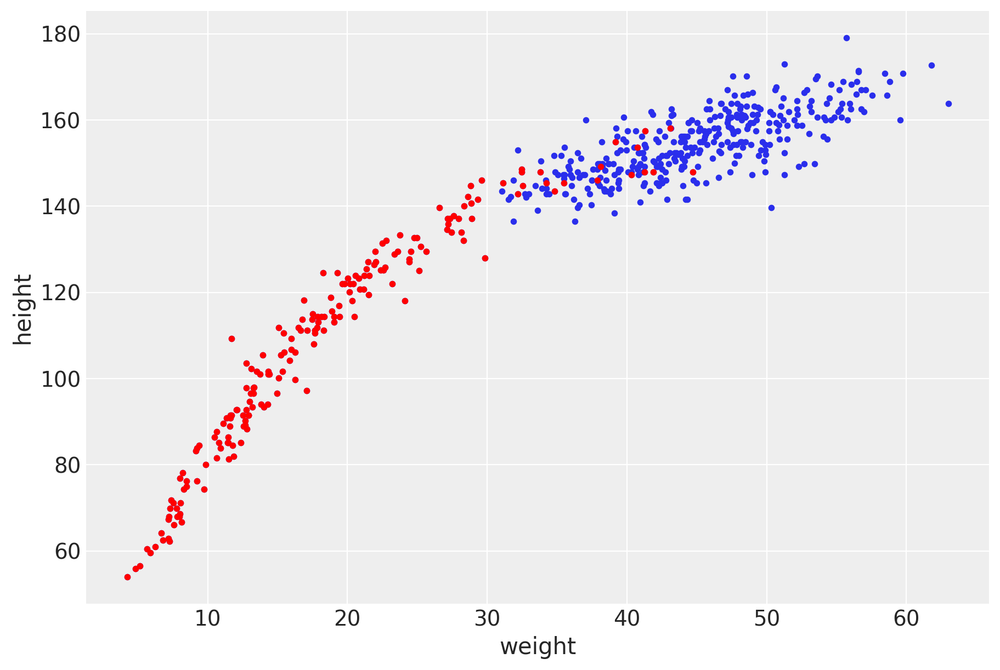

In [196]:
_, ax = plt.subplots(1, 1, figsize=(9, 6))

ax.scatter(howell.weight, howell.height, s=10)
ax.scatter(howell_u18.weight, howell_u18.height, s=10, c='r')
ax.set_xlabel("weight")
ax.set_ylabel("height");

In [211]:
with pm.Model() as mh_2:
    alpha = pm.Normal("alpha", mu=50, sd=20)  # prior on alpha
    beta = pm.Lognormal("beta", mu=0, tau=1)  # prior on beta
    sigma = pm.Uniform("sigma", 0, 50)  # prior on sigma
    mu = alpha + beta * (howell_u18.weight.values - np.mean(howell_u18.weight.values))
    height = pm.Normal("height", mu=mu, sd=sigma, observed=howell_u18.height)  # likelihood of the data
#     mean_q = pm.find_MAP()
#     print(mean_q)
    # find the hessian matrix
#     Hess = pm.find_hessian(mean_q, vars=[alpha, beta, sigma])
    trace_mh_2 = pm.sample(1000, tune=1000)

/var/folders/gg/8bsht44j631ftcb7v2s5lytm0000gn/T/ipykernel_7758/399033757.py:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_mh_2 = pm.sample(1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, beta, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 12 seconds.


/usr/local/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


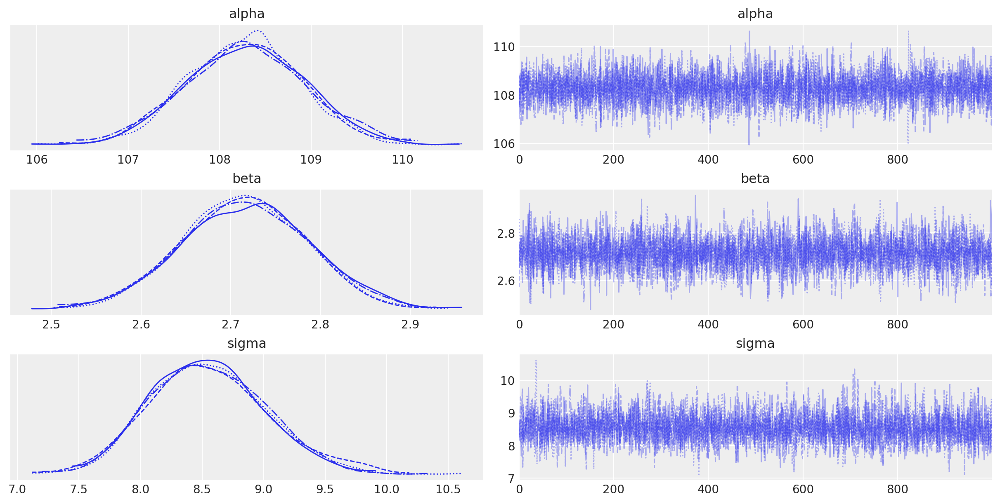

In [212]:
az.plot_trace(trace_mh_2);

In [213]:
trace_mh_2['beta'].mean()

2.7158873376928088

In [224]:
weight_seq = np.arange(5, 45)

mu_pred = np.zeros((len(weight_seq), len(trace_mh_2) * trace_mh_2.nchains))

for i, w in enumerate(weight_seq):
    mu_pred[i] = trace_mh_2["alpha"] + trace_mh_2["beta"] * (w - howell_u18.weight.mean())

In [226]:
mu_mean = mu_pred.mean(1)
mu_hdi = az.hdi(mu_pred.T)

/usr/local/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


In [234]:
height_pred = pm.sample_posterior_predictive(trace_mh_2, 2000, mh_2)
height_pred_hdi = az.hdi(height_pred["height"])

/usr/local/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/usr/local/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


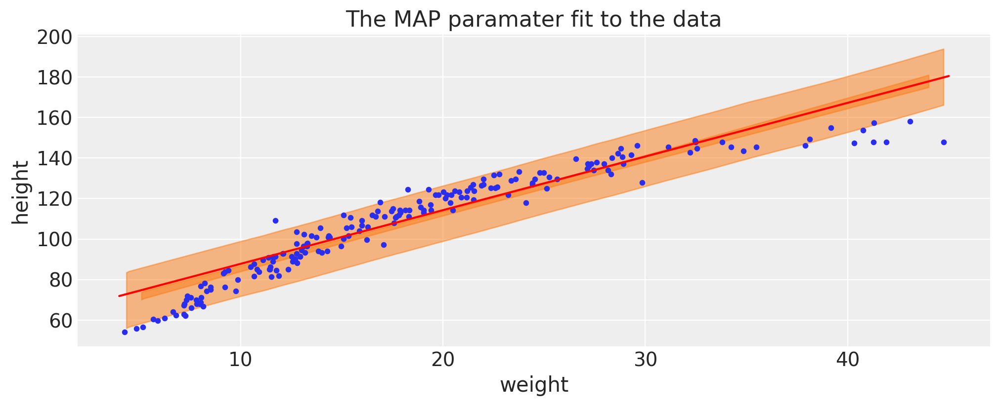

In [236]:
plt.figure(figsize=(10,4))
mu = trace_mh_2["alpha"].mean() + trace_mh_2["beta"].mean() * (np.linspace(5, 45, 100) - np.mean(howell_u18.weight))

ax = az.plot_hdi(weight_seq, mu_pred.T)
az.plot_hdi(howell_u18.weight, height_pred["height"], ax=ax)
plt.plot(np.linspace(4, 45, 100), mu, c='r')
plt.scatter(howell_u18.weight, howell_u18.height, s=10)
plt.title("The MAP paramater fit to the data")
plt.xlabel("weight")
plt.ylabel("height");

**Question 1:**  For every 10 units of increase in weight, how much taller does the model predict a child gets?

The beta value will answer this question. The model gives a beta value of 2.71 which means that with every 10 units of weight increase we expect the child to get 27.1 units of weight taller.

**Question 2:** (c) What aspect of the model fit concern you? Describe the kinds of assumptions you would change, if any, to improve the model. You don't have to write any new code. Just explain what the model appears to be doing a bad job of, and what you hypothesize would be a better model. 

A linear fit is clearly the wrong choice here as the data curves. A second order linear model would perform a lot better here at picking up the trend.

## 4H3.

Suppose a colleague of yours, who works on allometry, glances at the practice problems just above. Your colleague exclaims, "That's silly. Everyone knows that it's only _logarithm_ of body weight that scales with height!" Let's take your colleague's advice and see what happens.

(a) Model the relationship between height (cm) and the natural logarithm of weight (log-kg). Use the entire Howell data frame, all 544 rows, adults and non-adults. Can you interpret the resulting estimates?

(b) Begin with this plot: _plot( height ~ weight, data=Howell )_. Then use samples from the quadratic approximate posterior of the model in (a) to superimpose on the plot: (1) the predicted mean height as a function of weight, (2) the 97% interval of the mean, and (3) then 97% interval for predicted heights.

In [256]:
howell['weight_log'] = np.log(howell['weight'])
howell.head()

,height,weight,age,male,weight_log,weight_std,weight_std2
0,151.765,47.825606,63.0,1,3.867561,0.829869,0.688682
1,139.700,36.485807,63.0,0,3.596923,0.059459,0.003535
2,136.525,31.864838,65.0,0,3.461503,-0.254483,0.064762
3,156.845,53.041914,41.0,1,3.971082,1.184257,1.402466
4,145.415,41.276872,51.0,0,3.720302,0.384957,0.148192


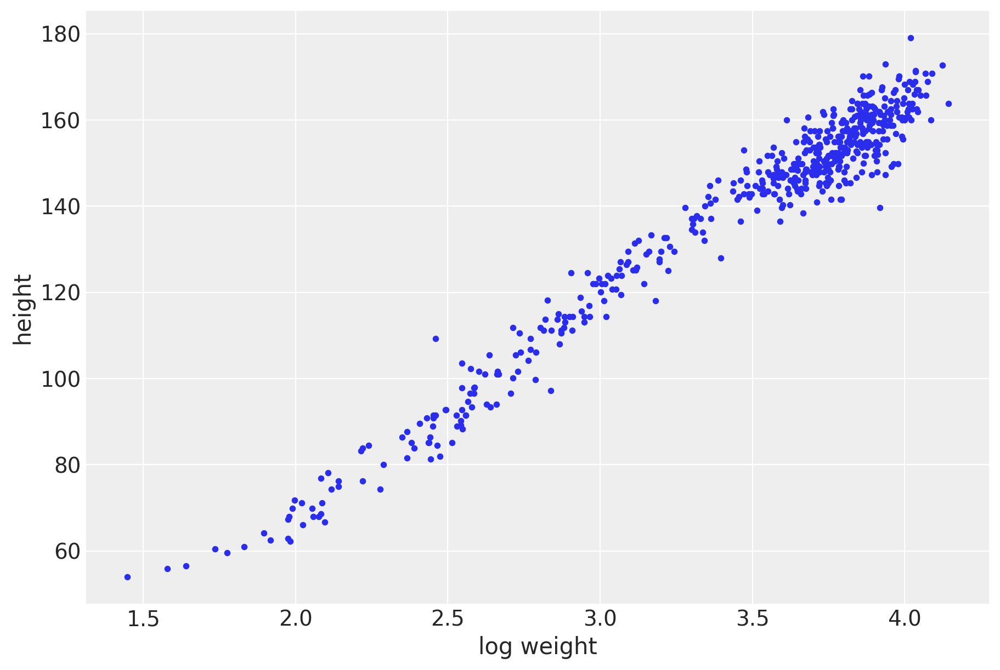

In [257]:
_, ax = plt.subplots(1, 1, figsize=(9, 6))

ax.scatter(howell.weight_log, howell.height, s=10)
ax.set_xlabel("log weight")
ax.set_ylabel("height");

In [258]:
with pm.Model() as mh_3:
    alpha = pm.Normal("alpha", mu=50, sd=20)  # prior on alpha
    beta = pm.Lognormal("beta", mu=0, tau=1)  # prior on beta
    sigma = pm.Uniform("sigma", 0, 50)  # prior on sigma
    mu = alpha + beta * (howell.weight_log.values - np.mean(howell.weight_log.values))
    height = pm.Normal("height", mu=mu, sd=sigma, observed=howell.height)  # likelihood of the data
#     mean_q = pm.find_MAP()
#     print(mean_q)
    # find the hessian matrix
#     Hess = pm.find_hessian(mean_q, vars=[alpha, beta, sigma])
    trace_mh_3 = pm.sample(1000, tune=1000)

/var/folders/gg/8bsht44j631ftcb7v2s5lytm0000gn/T/ipykernel_7758/2034964638.py:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_mh_3 = pm.sample(1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, beta, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 12 seconds.


/usr/local/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


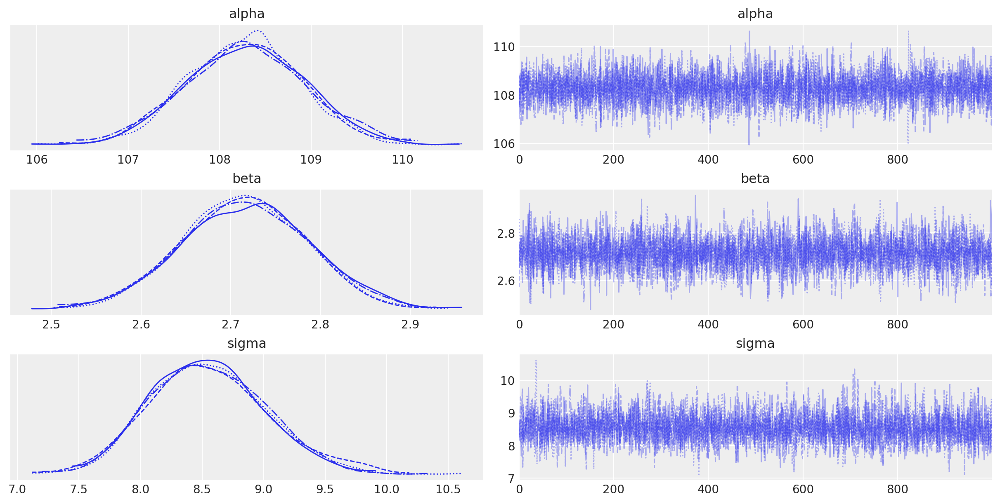

In [259]:
az.plot_trace(trace_mh_2);

In [260]:
log_weight_seq = np.arange(1, 4.5)

mu_pred = np.zeros((len(log_weight_seq), len(trace_mh_3) * trace_mh_3.nchains))

for i, w in enumerate(log_weight_seq):
    mu_pred[i] = trace_mh_3["alpha"] + trace_mh_3["beta"] * (w - howell.weight_log.mean())

In [261]:
mu_mean = mu_pred.mean(1)
mu_hdi = az.hdi(mu_pred.T)

/usr/local/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


In [262]:
height_pred = pm.sample_posterior_predictive(trace_mh_3, 2000, mh_3)
height_pred_hdi = az.hdi(height_pred["height"])

/usr/local/lib/python3.9/site-packages/pymc3/sampling.py:1689: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


/usr/local/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/usr/local/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


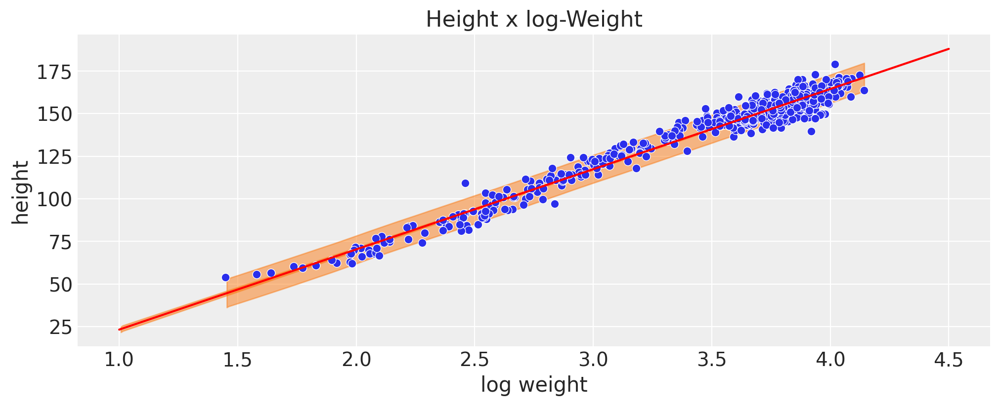

In [264]:
plt.figure(figsize=(10,4))
mu = trace_mh_3["alpha"].mean() + trace_mh_3["beta"].mean() * (np.linspace(1, 4.5, 100) - np.mean(howell.weight_log))

ax = az.plot_hdi(log_weight_seq, mu_pred.T)
az.plot_hdi(howell.weight_log, height_pred["height"], ax=ax)
plt.plot(np.linspace(1, 4.5, 100), mu, c='r')
# plt.scatter(howell.weight_log, howell.height, s=10)
sns.scatterplot(x="weight_log", y="height", data=howell);
plt.title("Height x log-Weight")
plt.xlabel("log weight")
plt.ylabel("height");

**TODO:** Transform this plot into height vs weight along with the predictions

## 4H4.

Plot the prior predictive distribution for the parabolic polynomial regression model in the chapter. You can modify the code that plots the linear regression prior predictive distribution. Can you modify the prior distribution of $\alpha$, $\beta_{1}$, $\beta_{2}$, so that the prior predictions stay within the biologically reasonable outcome space? That is to say: Do not try to fit data by hand. But do try to keep the curves consistent with what you know about height and weight, before seeing these exact data.

In [248]:
howell["weight_std"] = (howell.weight - howell.weight.mean()) / howell.weight.std()
howell["weight_std2"] = howell.weight_std ** 2

with pm.Model() as mh_4:
    a = pm.Normal("a", mu=178, sd=100)
    b1 = pm.Lognormal("b1", mu=0, sd=1)
    b2 = pm.Normal("b2", mu=0, sd=1)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    mu = pm.Deterministic("mu", a + b1 * howell.weight_std + b2 * howell.weight_std2)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=howell.height)
    trace_mh_4 = pm.sample(1000, tune=1000)

/var/folders/gg/8bsht44j631ftcb7v2s5lytm0000gn/T/ipykernel_7758/324343472.py:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_mh_4 = pm.sample(1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b2, b1, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 12 seconds.


/usr/local/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


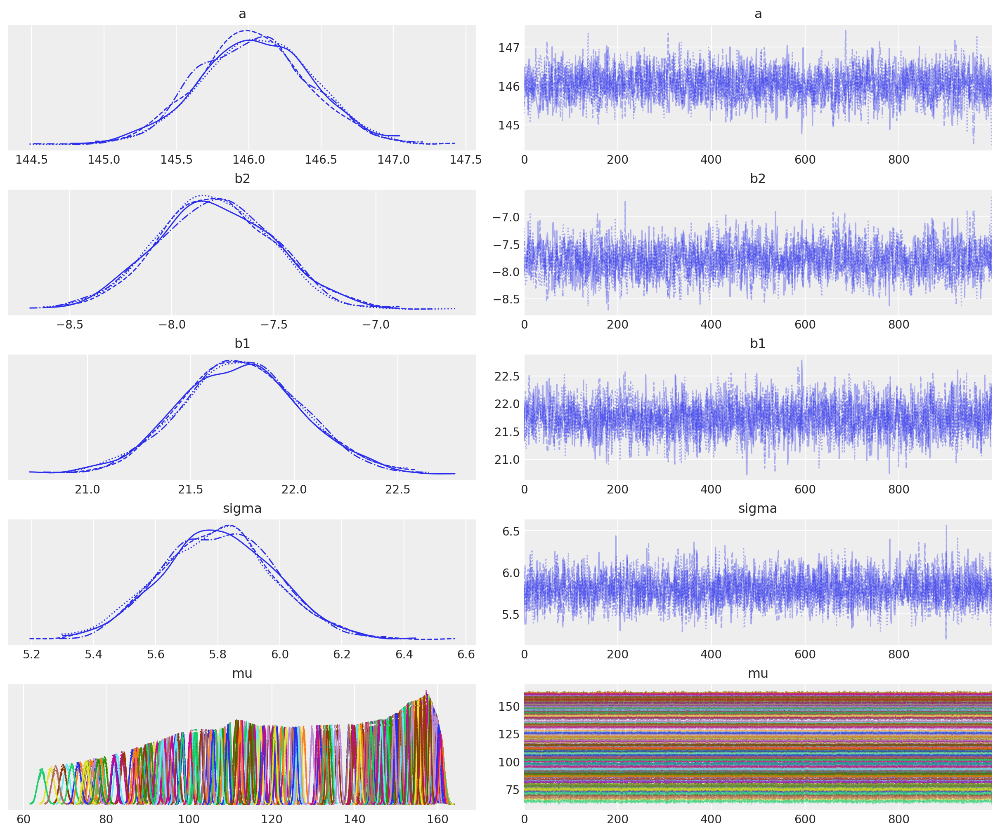

In [249]:
az.plot_trace(trace_mh_4);

In [250]:
mu_pred = trace_mh_4["mu"]
height_pred = pm.sample_posterior_predictive(trace_mh_4, 200, mh_4)

/usr/local/lib/python3.9/site-packages/pymc3/sampling.py:1689: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


/usr/local/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/usr/local/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


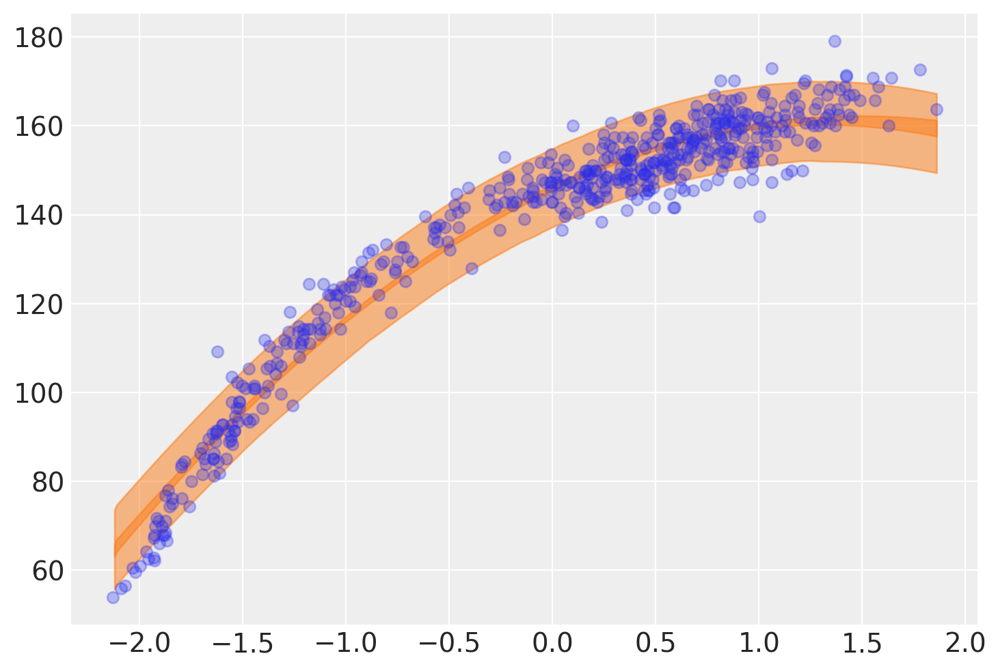

In [253]:
ax = az.plot_hdi(howell.weight_std, mu_pred)
az.plot_hdi(howell.weight_std, height_pred["height"], ax=ax)
plt.scatter(howell.weight_std, howell.height, c="C0", alpha=0.3);

# Task

Fit a line to the blossom data. Calculate predictions and 89% intervals for specific values.

In [107]:
blossom = pd.read_csv("../Data/cherry_blossoms.csv")
blossom = blossom.dropna(subset=['doy', 'temp'])

blossom

,year,doy,temp,temp_upper,temp_lower
50,851,108.0,7.38,12.10,2.66
63,864,100.0,6.42,8.69,4.14
65,866,106.0,6.44,8.11,4.77
88,889,104.0,6.83,8.48,5.19
90,891,109.0,6.98,8.96,5.00
...,...,...,...,...,...
1175,1976,99.0,8.20,8.77,7.63
1176,1977,93.0,8.22,8.78,7.66
1177,1978,104.0,8.20,8.78,7.61
1178,1979,97.0,8.28,8.83,7.73


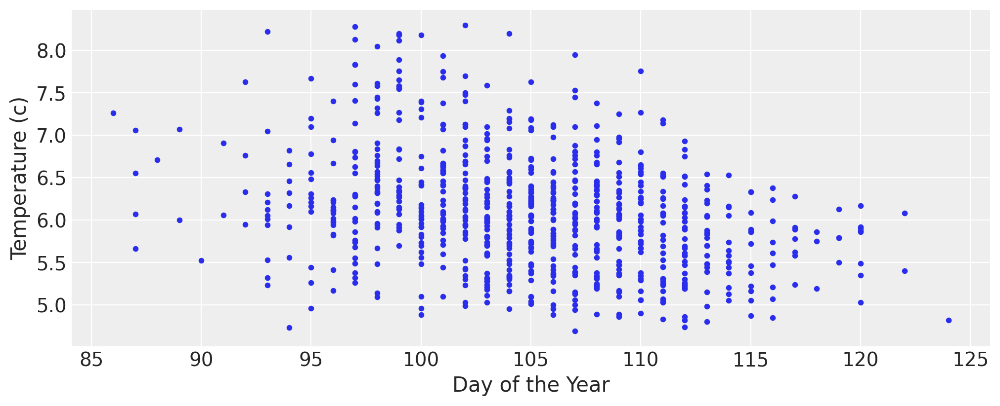

In [128]:
_, ax = plt.subplots(1, 1, figsize=(10, 4))

ax.scatter(blossom.doy, blossom.temp, s=10)
ax.set_xlabel("Day of the Year")
ax.set_ylabel("Temperature (c)");

In [134]:
with pm.Model() as model:
    alpha = pm.Normal("alpha", mu=8, sd=1)  # prior on alpha
    beta = pm.Lognormal("beta", mu=0, tau=1)  # prior on beta
    sigma = pm.Uniform("sigma", 0, 1)  # prior on sigma
    mu = alpha + beta * blossom.doy.values
    temp = pm.Normal("temp", mu=mu, sd=sigma, observed=blossom.temp)  # likelihood of the data
    mean_q = pm.find_MAP()
    print(mean_q)
    # find the hessian matrix
    Hess = pm.find_hessian(mean_q, vars=[alpha, beta, sigma])


{'alpha': array(5.89633875), 'beta_log__': array(-6.23659326), 'sigma_interval__': array(0.78650811), 'beta': array(0.00195651), 'sigma': array(0.68708106)}


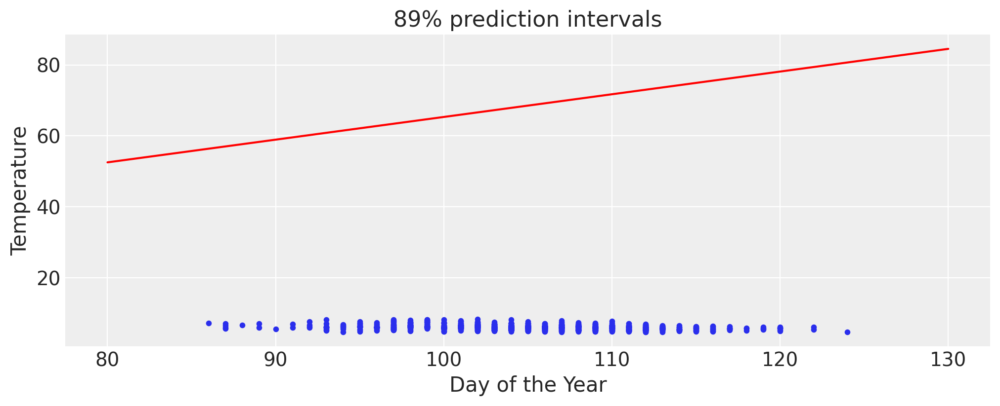

In [175]:
plt.figure(figsize=(10,4))
mu = mean_q["alpha"] + mean_q["beta"] * (np.linspace(80, 130, 100))
plt.plot(np.linspace(80, 130, 100), mu, c='r')
plt.scatter(blossom.doy, blossom.temp, s=10)
plt.title("89% prediction intervals")
plt.xlabel("Day of the Year")
plt.ylabel("Temperature");

In [144]:
# reg = LinearRegression().fit(blossom.doy.values, blossom.temp.values)

In [150]:
reedfrogs = pd.read_csv("../Data/reedfrogs.csv")

reedfrogs.head()

,density,pred,size,surv,propsurv
0,10,no,big,9,0.9
1,10,no,big,10,1.0
2,10,no,big,7,0.7
3,10,no,big,10,1.0
4,10,no,small,9,0.9


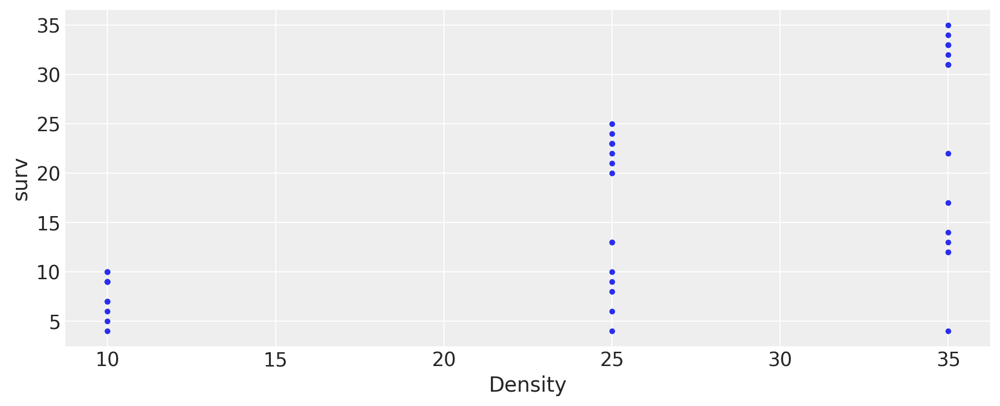

In [152]:
_, ax = plt.subplots(1, 1, figsize=(10, 4))

ax.scatter(reedfrogs.density, reedfrogs.surv, s=10)
ax.set_xlabel("Density")
ax.set_ylabel("surv");

In [153]:
with pm.Model() as model:
    alpha = pm.Normal("alpha", mu=0, sd=10)  # prior on alpha
    beta = pm.Lognormal("beta", mu=0, tau=1)  # prior on beta
    sigma = pm.Uniform("sigma", 0, 1)  # prior on sigma
    mu = alpha + beta * reedfrogs.density.values
    surv = pm.Normal("surv", mu=mu, sd=sigma, observed=reedfrogs.surv)  # likelihood of the data
    mean_q = pm.find_MAP()
    print(mean_q)
    # find the hessian matrix
    Hess = pm.find_hessian(mean_q, vars=[alpha, beta, sigma])


{'alpha': array(1.39360916), 'beta_log__': array(-0.44727459), 'sigma_interval__': array(19.61777305), 'beta': array(0.63936832), 'sigma': array(1.)}


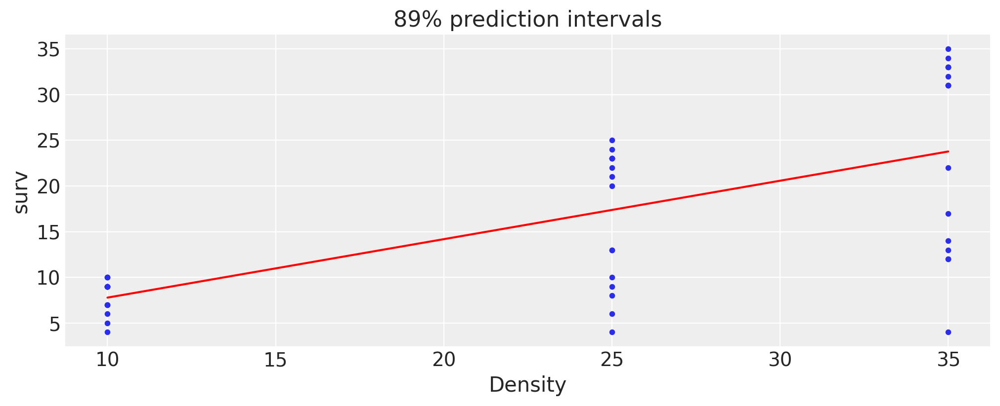

In [155]:
plt.figure(figsize=(10,4))
mu = mean_q["alpha"] + mean_q["beta"] * (np.linspace(10, 35, 100))
plt.plot(np.linspace(10, 35, 100), mu, c='r')
plt.scatter(reedfrogs.density, reedfrogs.surv, s=10)
plt.title("The MAP paramater fit to the data")
plt.xlabel("Density")
plt.ylabel("surv");

In [160]:
var_cov = np.linalg.inv(Hess)
var_cov

array([[ 1.28125104e-01, -4.59936275e-03,  5.74723216e-07],
       [-4.59936275e-03,  1.97156613e-04, -2.80216631e-08],
       [ 5.74723216e-07, -2.80216631e-08,  1.33098134e-04]])

In [156]:
means = np.fromiter(mean_q.values(), dtype=float)[[0, 3, 4]]
means

array([1.39360916, 0.63936832, 1.        ])

In [168]:
# resample for posterior for 10,000 sample
post_samples = np.random.multivariate_normal(means, var_cov, size=10000)
# compute the hpdi for a range of weight values
cred_intervals = np.array(
    [az.hdi(post_samples[:, 0] + post_samples[:, 1] * (x)) for x in np.linspace(10, 35)]
)

In [169]:
# define a function to compute mu for all posterior samples at given value of x
def compute_mu(x):
    return post_samples[:, 0] + post_samples[:, 1] * (x)

In [170]:
# compute the prediction interval in one line
pred_intervals = np.array(
    [
        az.hdi(np.random.normal(loc=compute_mu(x), scale=post_samples[:, 2]))
        for x in np.linspace(10, 35)
    ]
)

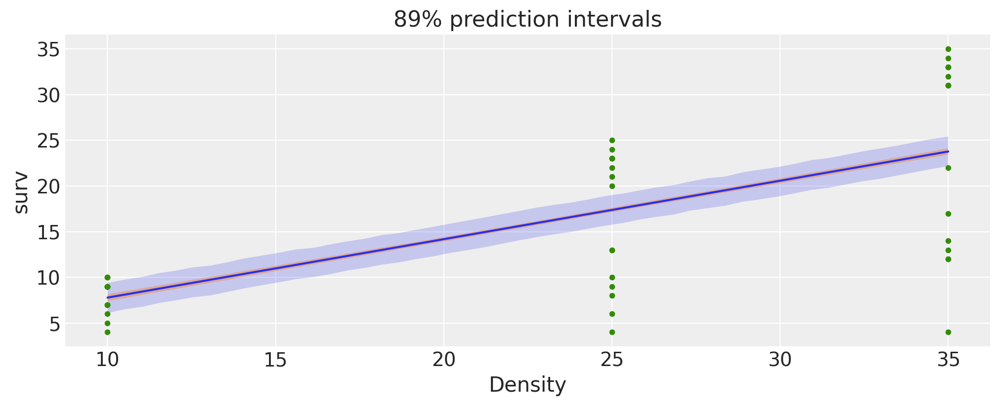

In [179]:
plt.figure(figsize=(10,4))

plt.fill_between(np.linspace(10, 35), pred_intervals[:, 0], pred_intervals[:, 1], alpha=0.2)
plt.fill_between(np.linspace(10, 35), cred_intervals[:, 0], cred_intervals[:, 1], alpha=0.4)

mu = mean_q["alpha"] + mean_q["beta"] * (np.linspace(10, 35, 100))
plt.plot(np.linspace(10, 35, 100), mu)
plt.scatter(reedfrogs.density, reedfrogs.surv, s=10)
plt.title("89% prediction intervals")
plt.xlabel("Density")
plt.ylabel("surv");